In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
%matplotlib inline

In [192]:
df = pd.read_csv('zomato.csv', encoding = 'latin-1')

In [7]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [9]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [11]:
 df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [193]:
 df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [14]:
[feature for feature in df.columns if df[feature].isnull().sum()>0]

['Cuisines']

<AxesSubplot:>

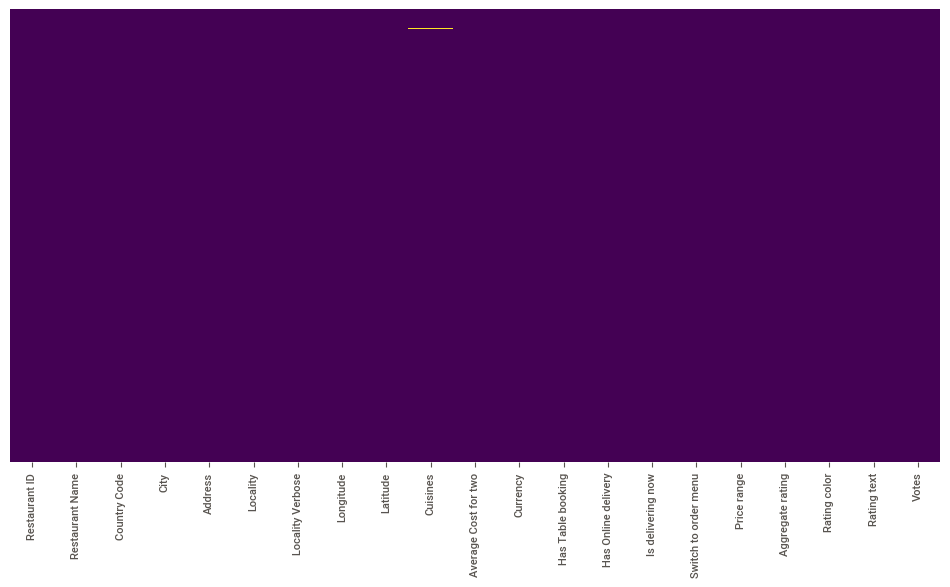

In [194]:
sns.heatmap(df.isnull(), yticklabels= False, cbar=False, cmap = 'viridis')

In [18]:
df_country = pd.read_excel('Country-Code.xlsx')
df_country.head()

,Country Code,Country
0,1,India
1,14,Australia
2,30,Brazil
3,37,Canada
4,94,Indonesia


In [20]:
final_df= pd.merge(df, df_country, on = 'Country Code', how = 'left')

In [21]:
country_names = final_df.Country.value_counts().index

In [22]:
country_names

Index(['India', 'United States', 'United Kingdom', 'UAE', 'South Africa',
       'Brazil', 'New Zealand', 'Turkey', 'Australia', 'Phillipines',
       'Indonesia', 'Qatar', 'Sri Lanka', 'Singapore', 'Canada'],
      dtype='object')

In [25]:
country_val = final_df.Country.value_counts().values

([<matplotlib.patches.Wedge at 0x7fa28d7b1a00>,
 [Text(-1.0829742700952103, 0.19278674827836725, 'India'),
  Text(1.077281715838356, -0.22240527134123297, 'United States'),
  Text(1.0995865153823035, -0.030157837943120734, 'United Kingdom')],
 [Text(-0.590713238233751, 0.10515640815183668, '94.392%'),
  Text(0.5876082086391032, -0.12131196618612707, '4.735%'),
  Text(0.5997744629358018, -0.016449729787156763, '0.873%')])

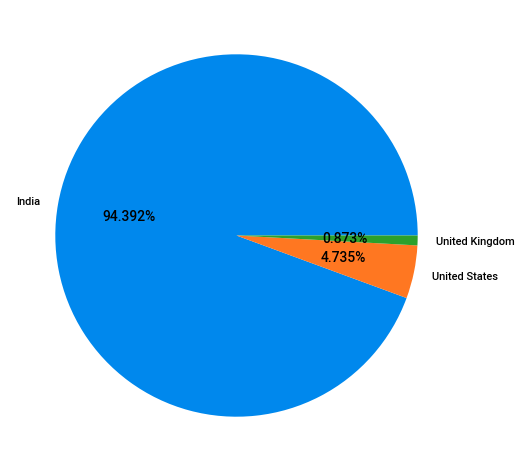

In [187]:
plt.pie(country_val[:3], labels = country_names[:3], autopct = "%1.3f%%")

In [30]:
final_df.columns


Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'Country'],
      dtype='object')

In [42]:
ratings = df.groupby(['Aggregate rating', 'Rating color', 'Rating text']).size().reset_index().rename(columns = {0:'Rating count'})

In [45]:
ratings.head()

,Aggregate rating,Rating color,Rating text,Rating count
0,0.0,White,Not rated,2148
1,1.8,Red,Poor,1
2,1.9,Red,Poor,2
3,2.0,Red,Poor,7
4,2.1,Red,Poor,15


<AxesSubplot:xlabel='Aggregate rating', ylabel='Rating count'>

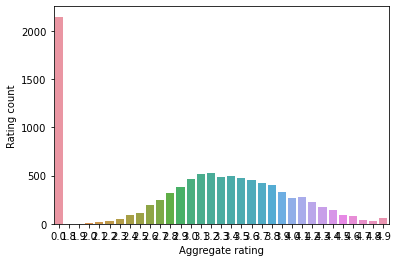

In [47]:

sns.barplot(x='Aggregate rating', y='Rating count', data = ratings)

<AxesSubplot:xlabel='Aggregate rating', ylabel='Rating count'>

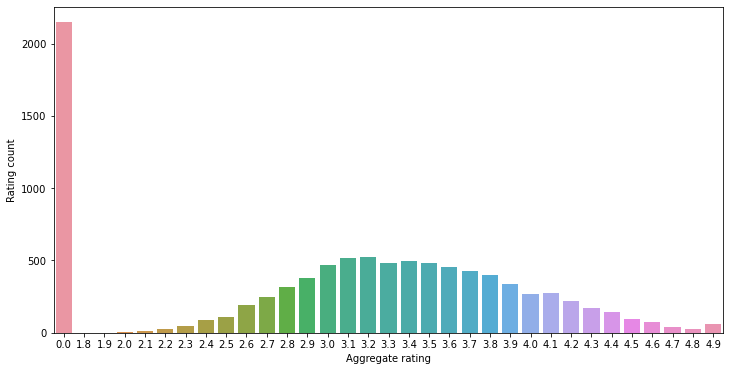

In [50]:
matplotlib.rcParams['figure.figsize'] = (12,6)
sns.barplot(x='Aggregate rating', y='Rating count', data = ratings)

/usr/local/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Rating color', ylabel='count'>

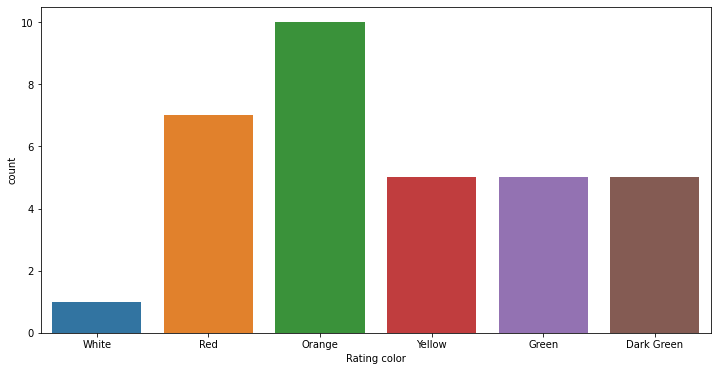

In [51]:
sns.countplot('Rating color', data = ratings)

In [54]:
# countries that have given zero ratings

final_df[final_df['Rating color'] == 'White'].groupby('Country').size().reset_index()

,Country,0
0,Brazil,5
1,India,2139
2,United Kingdom,1
3,United States,3


In [55]:
final_df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'Country'],
      dtype='object')

In [56]:
#countries and currencies
final_df[['Country', 'Currency']].groupby(['Country', 'Currency']).size().reset_index()

,Country,Currency,0
0,Australia,Dollar($),24
1,Brazil,Brazilian Real(R$),60
2,Canada,Dollar($),4
3,India,Indian Rupees(Rs.),8652
4,Indonesia,Indonesian Rupiah(IDR),21
5,New Zealand,NewZealand($),40
6,Phillipines,Botswana Pula(P),22
7,Qatar,Qatari Rial(QR),20
8,Singapore,Dollar($),20
9,South Africa,Rand(R),60


In [59]:
#which countries have online delivery
delivery = final_df[['Country', 'Has Online delivery']].groupby(['Country', 'Has Online delivery']).size().reset_index()
delivery[delivery['Has Online delivery'] =='Yes']

,Country,Has Online delivery,0
4,India,Yes,2423
14,UAE,Yes,28


# BLACK FRIDAY


In [61]:
blackFriday = pd.read_csv('blackFriday_train.csv')

In [62]:
blackFriday.head()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,NaN,NaN,8370
1,1000001,P00248942,F,0-17,10,A,2,0,1,6.0,14.0,15200
2,1000001,P00087842,F,0-17,10,A,2,0,12,NaN,NaN,1422
3,1000001,P00085442,F,0-17,10,A,2,0,12,14.0,NaN,1057
4,1000002,P00285442,M,55+,16,C,4+,0,8,NaN,NaN,7969


In [63]:
blackFriday.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 12 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   User_ID                     550068 non-null  int64  
 1   Product_ID                  550068 non-null  object 
 2   Gender                      550068 non-null  object 
 3   Age                         550068 non-null  object 
 4   Occupation                  550068 non-null  int64  
 5   City_Category               550068 non-null  object 
 6   Stay_In_Current_City_Years  550068 non-null  object 
 7   Marital_Status              550068 non-null  int64  
 8   Product_Category_1          550068 non-null  int64  
 9   Product_Category_2          376430 non-null  float64
 10  Product_Category_3          166821 non-null  float64
 11  Purchase                    550068 non-null  int64  
dtypes: float64(2), int64(5), object(5)
memory usage: 50.4+ MB


In [64]:
blackFriday.describe()

,User_ID,Occupation,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
count,5.500680e+05,550068.000000,550068.000000,550068.000000,376430.000000,166821.000000,550068.000000
mean,1.003029e+06,8.076707,0.409653,5.404270,9.842329,12.668243,9263.968713
std,1.727592e+03,6.522660,0.491770,3.936211,5.086590,4.125338,5023.065394
min,1.000001e+06,0.000000,0.000000,1.000000,2.000000,3.000000,12.000000
25%,1.001516e+06,2.000000,0.000000,1.000000,5.000000,9.000000,5823.000000
50%,1.003077e+06,7.000000,0.000000,5.000000,9.000000,14.000000,8047.000000
75%,1.004478e+06,14.000000,1.000000,8.000000,15.000000,16.000000,12054.000000
max,1.006040e+06,20.000000,1.000000,20.000000,18.000000,18.000000,23961.000000


In [66]:
blackFriday.isnull().sum()

User_ID                            0
Product_ID                         0
Gender                             0
Age                                0
Occupation                         0
City_Category                      0
Stay_In_Current_City_Years         0
Marital_Status                     0
Product_Category_1                 0
Product_Category_2            173638
Product_Category_3            383247
Purchase                           0
dtype: int64

In [67]:
blackFriday.count()

User_ID                       550068
Product_ID                    550068
Gender                        550068
Age                           550068
Occupation                    550068
City_Category                 550068
Stay_In_Current_City_Years    550068
Marital_Status                550068
Product_Category_1            550068
Product_Category_2            376430
Product_Category_3            166821
Purchase                      550068
dtype: int64

In [68]:
blackFriday_test = pd.read_csv('blackFriday_test.csv')

In [81]:
df = blackFriday.append(blackFriday_test)

In [72]:
df.count()

User_ID                       783667
Product_ID                    783667
Gender                        783667
Age                           783667
Occupation                    783667
City_Category                 783667
Stay_In_Current_City_Years    783667
Marital_Status                783667
Product_Category_1            783667
Product_Category_2            537685
Product_Category_3            237858
Purchase                      550068
dtype: int64

In [86]:
df.drop(['User_ID'], axis=1, inplace = True)

In [74]:
df.head()

,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,P00069042,F,0-17,10,A,2,0,3,NaN,NaN,8370.0
1,P00248942,F,0-17,10,A,2,0,1,6.0,14.0,15200.0
2,P00087842,F,0-17,10,A,2,0,12,NaN,NaN,1422.0
3,P00085442,F,0-17,10,A,2,0,12,14.0,NaN,1057.0
4,P00285442,M,55+,16,C,4+,0,8,NaN,NaN,7969.0


## HANDLE GENDER


In [83]:
df['Gender'] = df['Gender'].map({'F':0, 'M':1})

In [76]:
df.head()

,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,P00069042,0,0-17,10,A,2,0,3,NaN,NaN,8370.0
1,P00248942,0,0-17,10,A,2,0,1,6.0,14.0,15200.0
2,P00087842,0,0-17,10,A,2,0,12,NaN,NaN,1422.0
3,P00085442,0,0-17,10,A,2,0,12,14.0,NaN,1057.0
4,P00285442,1,55+,16,C,4+,0,8,NaN,NaN,7969.0


## HANDLE AGE

In [77]:
df['Age'].unique()

array(['0-17', '55+', '26-35', '46-50', '51-55', '36-45', '18-25'],
      dtype=object)

In [78]:
df['Age'] = df['Age'].map({'0-17':1, '18-25':2, '26-35':3, '36-45':4, '46-50':5, '51-55':6, '55+':7})

In [82]:
df.head()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,NaN,NaN,8370.0
1,1000001,P00248942,F,0-17,10,A,2,0,1,6.0,14.0,15200.0
2,1000001,P00087842,F,0-17,10,A,2,0,12,NaN,NaN,1422.0
3,1000001,P00085442,F,0-17,10,A,2,0,12,14.0,NaN,1057.0
4,1000002,P00285442,M,55+,16,C,4+,0,8,NaN,NaN,7969.0


In [84]:

# Import label encoder
from sklearn import preprocessing
 
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
 
# Encode labels in column 'species'.
df['Age']= label_encoder.fit_transform(df['Age'])
 
df['Age'].unique()

array([0, 6, 2, 4, 5, 3, 1])

In [161]:
label_encoder.classes_

array(['0-17', '18-25', '26-35', '36-45', '46-50', '51-55', '55+'],
      dtype=object)

In [85]:
df.head()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,1000001,P00069042,0,0,10,A,2,0,3,NaN,NaN,8370.0
1,1000001,P00248942,0,0,10,A,2,0,1,6.0,14.0,15200.0
2,1000001,P00087842,0,0,10,A,2,0,12,NaN,NaN,1422.0
3,1000001,P00085442,0,0,10,A,2,0,12,14.0,NaN,1057.0
4,1000002,P00285442,1,6,16,C,4+,0,8,NaN,NaN,7969.0


In [90]:
df_city = pd.get_dummies(df['City_Category'], drop_first=True)

In [91]:
df = pd.concat([df, df_city], axis=1)

In [94]:
df.columns

Index(['Product_ID', 'Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category_1',
       'Product_Category_2', 'Product_Category_3', 'Purchase', 'B', 'C'],
      dtype='object')

In [96]:
df.drop('City_Category', axis =1, inplace = True)
df.head()

,Product_ID,Gender,Age,Occupation,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase,B,C
0,P00069042,0,0,10,2,0,3,NaN,NaN,8370.0,0,0
1,P00248942,0,0,10,2,0,1,6.0,14.0,15200.0,0,0
2,P00087842,0,0,10,2,0,12,NaN,NaN,1422.0,0,0
3,P00085442,0,0,10,2,0,12,14.0,NaN,1057.0,0,0
4,P00285442,1,6,16,4+,0,8,NaN,NaN,7969.0,0,1


In [98]:
df['Product_Category_2'] = df['Product_Category_2'].fillna(df['Product_Category_2'].mode()[0])

In [99]:
df.head()

,Product_ID,Gender,Age,Occupation,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase,B,C
0,P00069042,0,0,10,2,0,3,8.0,NaN,8370.0,0,0
1,P00248942,0,0,10,2,0,1,6.0,14.0,15200.0,0,0
2,P00087842,0,0,10,2,0,12,8.0,NaN,1422.0,0,0
3,P00085442,0,0,10,2,0,12,14.0,NaN,1057.0,0,0
4,P00285442,1,6,16,4+,0,8,8.0,NaN,7969.0,0,1


In [100]:
df['Product_Category_3'] = df['Product_Category_3'].fillna(df['Product_Category_3'].mode()[0])

In [102]:
df['Stay_In_Current_City_Years'].unique()

array(['2', '4+', '3', '1', '0'], dtype=object)

In [103]:
df['Stay_In_Current_City_Years'] = df['Stay_In_Current_City_Years'].str.replace('+', '')

In [104]:
df.head()

,Product_ID,Gender,Age,Occupation,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase,B,C
0,P00069042,0,0,10,2,0,3,8.0,16.0,8370.0,0,0
1,P00248942,0,0,10,2,0,1,6.0,14.0,15200.0,0,0
2,P00087842,0,0,10,2,0,12,8.0,16.0,1422.0,0,0
3,P00085442,0,0,10,2,0,12,14.0,16.0,1057.0,0,0
4,P00285442,1,6,16,4,0,8,8.0,16.0,7969.0,0,1


In [106]:
## convert object into integers
df['Stay_In_Current_City_Years'] = df['Stay_In_Current_City_Years'].astype(int)

In [107]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 783667 entries, 0 to 233598
Data columns (total 12 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Product_ID                  783667 non-null  object 
 1   Gender                      783667 non-null  int64  
 2   Age                         783667 non-null  int64  
 3   Occupation                  783667 non-null  int64  
 4   Stay_In_Current_City_Years  783667 non-null  int64  
 5   Marital_Status              783667 non-null  int64  
 6   Product_Category_1          783667 non-null  int64  
 7   Product_Category_2          783667 non-null  float64
 8   Product_Category_3          783667 non-null  float64
 9   Purchase                    550068 non-null  float64
 10  B                           783667 non-null  uint8  
 11  C                           783667 non-null  uint8  
dtypes: float64(3), int64(6), object(1), uint8(2)
memory usage: 87.3+ MB


In [108]:
df['B'] = df['B'].astype(int)
df['C'] = df['C'].astype(int)

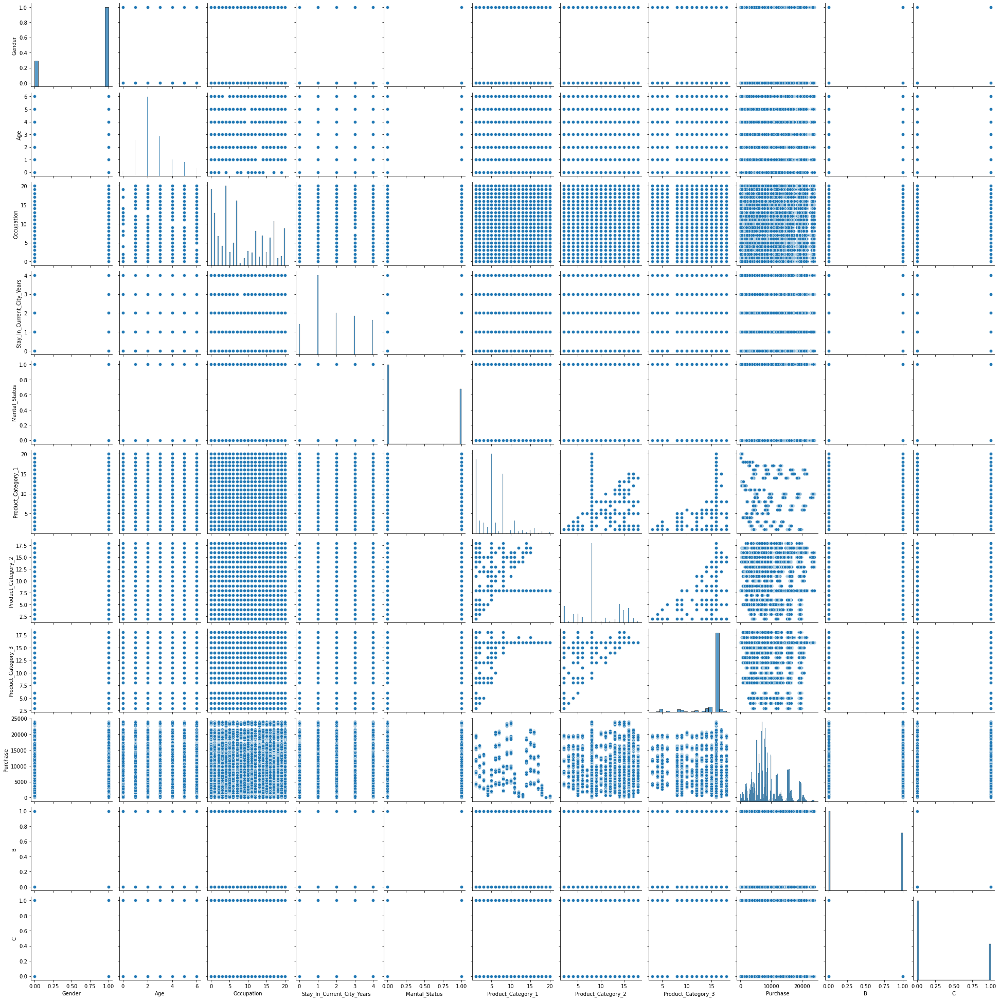

In [109]:
sns.pairplot(df)

/usr/local/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Age', ylabel='Purchase'>

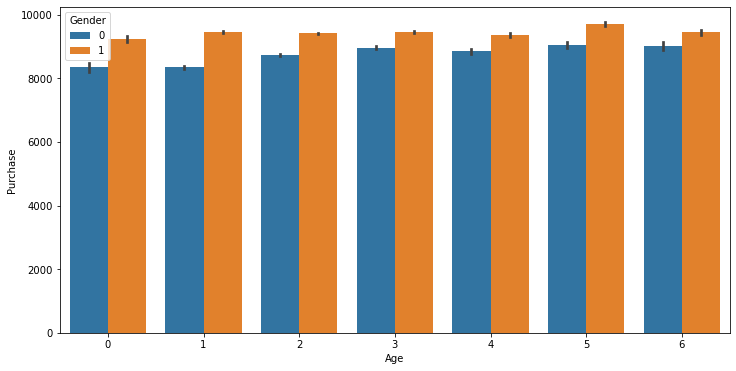

In [110]:
sns.barplot('Age', 'Purchase', hue='Gender', data=df)

/usr/local/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Occupation', ylabel='Purchase'>

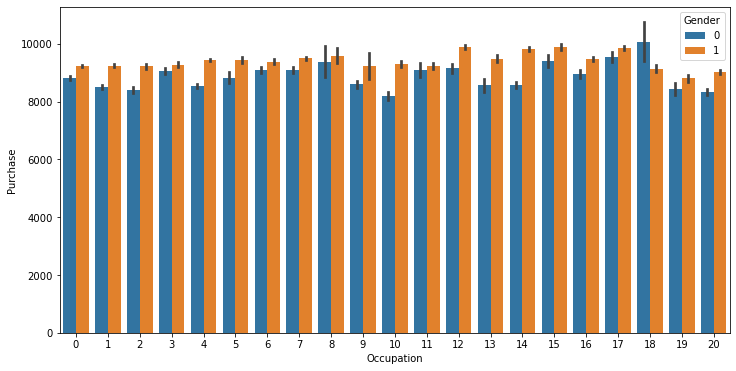

In [111]:
sns.barplot('Occupation', 'Purchase', hue='Gender', data=df)

/usr/local/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Product_Category_1', ylabel='Purchase'>

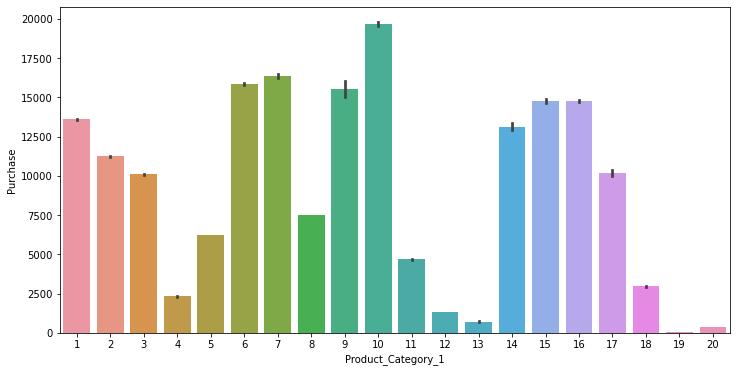

In [113]:
sns.barplot('Product_Category_1', 'Purchase', data=df)

/usr/local/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Product_Category_1', ylabel='Purchase'>

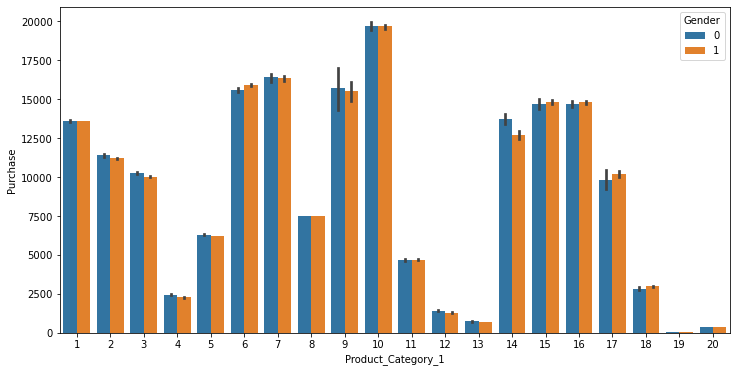

In [114]:
sns.barplot('Product_Category_1', 'Purchase', hue='Gender', data=df)

/usr/local/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Product_Category_2', ylabel='Purchase'>

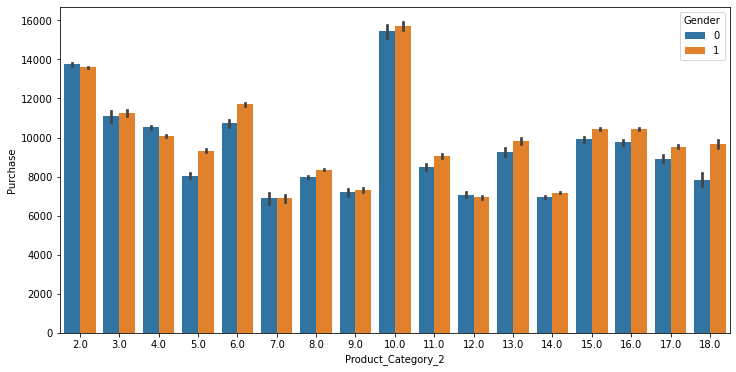

In [115]:
sns.barplot('Product_Category_2', 'Purchase', hue='Gender', data=df)

/usr/local/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Product_Category_3', ylabel='Purchase'>

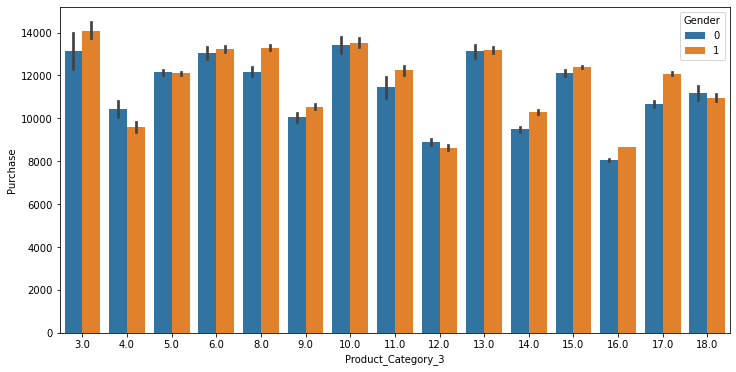

In [116]:
sns.barplot('Product_Category_3', 'Purchase', hue='Gender', data=df)

In [117]:
df_test = df[df['Purchase'].isnull()]
df_train = df[~df['Purchase'].isnull()]

In [118]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [124]:
X = df_train.drop(['Purchase', 'Product_ID'], axis=1)
y = df_train['Purchase']

In [125]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [126]:
X_train = sc.fit_transform(X_train)


In [127]:
X_test = sc.transform(X_test)

## FLIGHT PRICE PREDICTION

In [130]:
train_df = pd.read_excel('Flight Prediction/Data_Train.xlsx')

In [131]:
train_df.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302


In [133]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          10683 non-null  object
 1   Date_of_Journey  10683 non-null  object
 2   Source           10683 non-null  object
 3   Destination      10683 non-null  object
 4   Route            10682 non-null  object
 5   Dep_Time         10683 non-null  object
 6   Arrival_Time     10683 non-null  object
 7   Duration         10683 non-null  object
 8   Total_Stops      10682 non-null  object
 9   Additional_Info  10683 non-null  object
 10  Price            10683 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 918.2+ KB


In [134]:
train_df.shape

(10683, 11)

In [135]:
train_df.describe()

,Price
count,10683.000000
mean,9087.064121
std,4611.359167
min,1759.000000
25%,5277.000000
50%,8372.000000
75%,12373.000000
max,79512.000000


In [136]:
train_df.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Additional_Info    0
Price              0
dtype: int64

In [137]:
test_df = pd.read_excel('Flight Prediction/Test_set.xlsx')

In [138]:
test_df.shape

(2671, 10)

In [143]:
final_df = train_df.append(test_df)

In [144]:
final_df.shape

(13354, 11)

In [147]:
final_df['Date'] = final_df['Date_of_Journey'].apply(lambda x: x.split('/')[0]).astype(int)
final_df['Month'] = final_df['Date_of_Journey'].apply(lambda x: x.split('/')[1]).astype(int)
final_df['Year'] = final_df['Date_of_Journey'].apply(lambda x: x.split('/')[2]).astype(int)

In [148]:
final_df.drop('Date_of_Journey', axis=1, inplace=True)

In [153]:
final_df['Arrival_Hour'] = final_df['Arrival_Time'].apply(lambda x:x.split(' ')[0].split(':')[0]).astype(int)
final_df['Arrival_Minutes'] = final_df['Arrival_Time'].apply(lambda x:x.split(' ')[0].split(':')[1]).astype(int)

In [152]:
final_df.head()

,Airline,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Date,Month,Year,Arrival_Hour,Arrival_Minutes
0,IndiGo,Banglore,New Delhi,BLR → DEL,22:20,01:10,2h 50m,non-stop,No info,3897.0,24,3,2019,01,10
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662.0,1,5,2019,13,15
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25,19h,2 stops,No info,13882.0,9,6,2019,04,25
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218.0,12,5,2019,23,30
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302.0,1,3,2019,21,35


In [154]:
final_df['Dep_Hour'] = final_df['Dep_Time'].apply(lambda x:x.split(' ')[0].split(':')[0]).astype(int)
final_df['Dep_Minutes'] = final_df['Dep_Time'].apply(lambda x:x.split(' ')[0].split(':')[1]).astype(int)

In [155]:
final_df.drop(['Dep_Time', 'Arrival_Time'], axis=1, inplace=True)

In [157]:
final_df['Total_Stops'].unique()

array(['non-stop', '2 stops', '1 stop', '3 stops', nan, '4 stops'],
      dtype=object)

In [158]:
final_df['Total_Stops'] = final_df['Total_Stops'].map({'non-stop':0, '1 stop':1, '2 stops':2, '3 stops':3, '4 stops': 4, 'nan': 1})

In [159]:
final_df.drop('Route', axis=1, inplace=True)

In [163]:
pd.get_dummies(final_df, columns = ['Airline', 'Source', 'Destination', 'Additional_Info'], drop_first=True)

,Duration,Total_Stops,Price,Date,Month,Year,Arrival_Hour,Arrival_Minutes,Dep_Hour,Dep_Minutes,...,Destination_New Delhi,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No Info,Additional_Info_No check-in baggage included,Additional_Info_No info,Additional_Info_Red-eye flight
0,2h 50m,0.0,3897.0,24,3,2019,1,10,22,20,...,1,0,0,0,0,0,0,0,1,0
1,7h 25m,2.0,7662.0,1,5,2019,13,15,5,50,...,0,0,0,0,0,0,0,0,1,0
2,19h,2.0,13882.0,9,6,2019,4,25,9,25,...,0,0,0,0,0,0,0,0,1,0
3,5h 25m,1.0,6218.0,12,5,2019,23,30,18,5,...,0,0,0,0,0,0,0,0,1,0
4,4h 45m,1.0,13302.0,1,3,2019,21,35,16,50,...,1,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2666,23h 55m,1.0,NaN,6,6,2019,20,25,20,30,...,0,0,0,0,0,0,0,0,1,0
2667,2h 35m,0.0,NaN,27,3,2019,16,55,14,20,...,0,0,0,0,0,0,0,0,1,0
2668,6h 35m,1.0,NaN,6,3,2019,4,25,21,50,...,0,0,0,0,0,0,0,0,1,0
2669,15h 15m,1.0,NaN,6,3,2019,19,15,4,0,...,0,0,0,0,0,0,0,0,1,0


### AUTOMATED EDA #######


In [164]:
!pip install pandas_profiling

     |████████████████████████████████| 261 kB 1.3 MB/s eta 0:00:01
     |████████████████████████████████| 2.9 MB 11.3 MB/s eta 0:00:01
     |████████████████████████████████| 653 kB 9.4 MB/s eta 0:00:01
     |████████████████████████████████| 303 kB 6.5 MB/s eta 0:00:01
     |████████████████████████████████| 102 kB 10.0 MB/s ta 0:00:01
     |████████████████████████████████| 3.1 MB 10.1 MB/s eta 0:00:01
     |████████████████████████████████| 812 kB 11.3 MB/s eta 0:00:01
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27084 sha256=40a99bfb9f72f79b5f61a1900356e1245d1bcc6797538ca384de65aaeaf0b6d5
  Stored in directory: /Users/tusharagarwal/Library/Caches/pip/wheels/23/14/6e/4be5bfeeb027f4939a01764b48edd5996acf574b0913fe5243
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295199 sha256=06a315159a0abbdcfb90d16ff6e4c5eecdcdebe46476cfab6cf8f42bb9510ed7
  Stored in directory: /Users/tusharagarwal/Library/Caches/pip/wheels/48/a1/7

In [165]:
import pandas_profiling

In [166]:
df = sns.load_dataset('tips')

In [167]:
df.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [168]:
from pandas_profiling import ProfileReport 


In [172]:
profile = ProfileReport(final_df, explorative=True, dark_mode=True)

In [170]:
profile.to_file('output.html')

In [173]:
profile

In [174]:
!pip install dtale

     |████████████████████████████████| 11.4 MB 11.3 MB/s eta 0:00:01
     |████████████████████████████████| 642 kB 9.6 MB/s eta 0:00:01
     |████████████████████████████████| 62 kB 2.8 MB/s  eta 0:00:01
     |████████████████████████████████| 90 kB 10.0 MB/s eta 0:00:01
     |████████████████████████████████| 8.5 MB 9.6 MB/s eta 0:00:01
     |████████████████████████████████| 47 kB 7.9 MB/s  eta 0:00:01
     |████████████████████████████████| 27.7 MB 6.4 MB/s eta 0:00:012
     |████████████████████████████████| 209 kB 8.1 MB/s eta 0:00:01
     |████████████████████████████████| 45 kB 7.6 MB/s  eta 0:00:01
     |████████████████████████████████| 85.2 MB 334 kB/s  eta 0:00:01
     |████████████████████████████████| 7.2 MB 8.0 MB/s eta 0:00:01
     |████████████████████████████████| 865 kB 10.0 MB/s eta 0:00:01
     |████████████████████████████████| 421 kB 10.2 MB/s eta 0:00:01
  Created wheel for dash-daq: filename=dash_daq-0.5.0-py3-none-any.whl size=669702 sha256=557b88db0ee322b03e

  Created wheel for dash-colorscales: filename=dash_colorscales-0.0.4-py3-none-any.whl size=62597 sha256=d56af05fe0f47e8c10fe6fb7e1c16c6b4801e2729cdbf9fbbfe2122fa46a19db
  Stored in directory: /Users/tusharagarwal/Library/Caches/pip/wheels/fe/33/33/172dbfe1efc739352828854a113df599a428b58f68ed0c4f75
  Created wheel for ppscore: filename=ppscore-1.2.0-py2.py3-none-any.whl size=13048 sha256=e85f64b18484802fad3fcb208b7620669f54665db22731921b15681e624fa9bd
  Stored in directory: /Users/tusharagarwal/Library/Caches/pip/wheels/fb/0e/65/da65ce669381fc01b6ef990d301d3586991f89bff1175877a4
  Created wheel for dash-html-components: filename=dash_html_components-2.0.0-py3-none-any.whl size=4069 sha256=74353346889db2ca37a855f3925cf9fd8bda6bccb0f1a6b72694311abd3a166c
  Stored in directory: /Users/tusharagarwal/Library/Caches/pip/wheels/73/d8/8d/92f612c03c895f19bcc56a6c54be7bb41aaa698012a5624f60
  Created wheel for dash-core-components: filename=dash_core_components-2.0.0-py3-none-any.whl size=3804 sh

In [176]:
import dtale

In [177]:
dtale.show(df)

In [179]:
!pip install sweetviz

     |████████████████████████████████| 15.1 MB 11.3 MB/s eta 0:00:01


In [180]:
import sweetviz as sv

In [182]:
report = sv.analyze(df)
report.show_html('newreport.html')


Report newreport.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [183]:
!pip install dataprep

     |████████████████████████████████| 3.5 MB 698 kB/s eta 0:00:01
     |████████████████████████████████| 94 kB 6.9 MB/s  eta 0:00:01
     |████████████████████████████████| 220 kB 9.5 MB/s eta 0:00:01
     |████████████████████████████████| 574 kB 6.9 MB/s eta 0:00:01
     |████████████████████████████████| 63 kB 6.3 MB/s  eta 0:00:01
     |████████████████████████████████| 80 kB 13.9 MB/s eta 0:00:01
     |████████████████████████████████| 943 kB 11.0 MB/s eta 0:00:01
     |████████████████████████████████| 121 kB 9.4 MB/s eta 0:00:01
     |████████████████████████████████| 186 kB 11.6 MB/s eta 0:00:01


  Created wheel for metaphone: filename=Metaphone-0.6-py3-none-any.whl size=13905 sha256=3cd9fa9a314b93333f5446c2f4fe40af936278fae9d0398ce6ce8f66d168873a
  Stored in directory: /Users/tusharagarwal/Library/Caches/pip/wheels/ea/4e/3b/0634f08a7980461ad630fa4147cbd25913b008b4a02992ba66
  Created wheel for wordcloud: filename=wordcloud-1.8.1-cp38-cp38-macosx_10_9_x86_64.whl size=158000 sha256=d6c3ce881b98c1a1962989bece8d14de7d490bfccb3d058056ebfa030ea2b861
  Stored in directory: /Users/tusharagarwal/Library/Caches/pip/wheels/4d/3f/0d/a2ba9b7895c9f1be89018b3141c3df3d4f9c786c882ccfbc3b
Successfully built metaphone wordcloud
  Attempting uninstall: flask
    Found existing installation: Flask 1.1.2
    Uninstalling Flask-1.1.2:
      Successfully uninstalled Flask-1.1.2


DataPrep Report
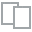
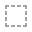
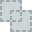
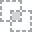
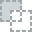
...
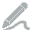
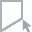
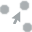
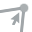
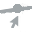

In [184]:
from dataprep.eda import create_report
create_report(df)